# Harmonic Percussive Source Separation (HPSS)
Escrito por Leonardo Pepino - Universidad Nacional de Tres de Febrero - Ingeniería de Sonido

In [1]:
%matplotlib inline

from scipy.io.wavfile import read
from scipy.signal import stft, istft 
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt

El primer paso será abrir una señal que contenga tanto componentes percusivas como armónicas. Normalmente esto ocurre en señales musicales. Las componentes percusivas pueden ser, por ejemplo, golpes de batería o el ataque de notas pulsadas, mientras que las armónicas pueden ser las vocales de una voz cantada o notas sostenidas por un tiempo. En este caso, abriremos una canción de Karnivool.

In [5]:
[fs,x] = read('We Are excerpt.wav')
x = x/(2**15-1)
monox = (x[:,0] + x[:,1])/2
eps = np.finfo(float).eps

Leemos el archivo wav y lo llevamos al rango de valores de -1 a 1. Posteriormente, transformamos la señal estéreo en mono para facilitar el análisis. eps es la resolución de punto flotante y nos permitirá luego evitar problemas en logaritmos y divisiones.

In [6]:
[f,t,spec] = stft(monox,window = 'hanning',fs = fs, nperseg = 2048,noverlap = 1024)
magspec = np.abs(spec)

Es muy útil computar una transformada de corto término de Fourier (STFT) para el análisis de señales no estacionarias como la música. Esta, nos permite ver como varía el espectro de una señal en función del tiempo, a diferencia de una FFT que no nos proveerá de información temporal. Para el análisis, utilicé una ventana de Hanning, la cual provee un buen compromiso entre ancho de lóbulo principal, y amplitud de lóbulos laterales. Para poder recuperar en tiempo una señal ventaneada con Hanning, es necesario minimamente un solapamiento del 50%. Para el análisis armónico-percusivo, se descartará la información de fase y se trabajará solo con la magnitud. Trabajamos con los primeros 30 segundos de la señal, aunque es posible cambiar el tiempo alterando la variable NSec.

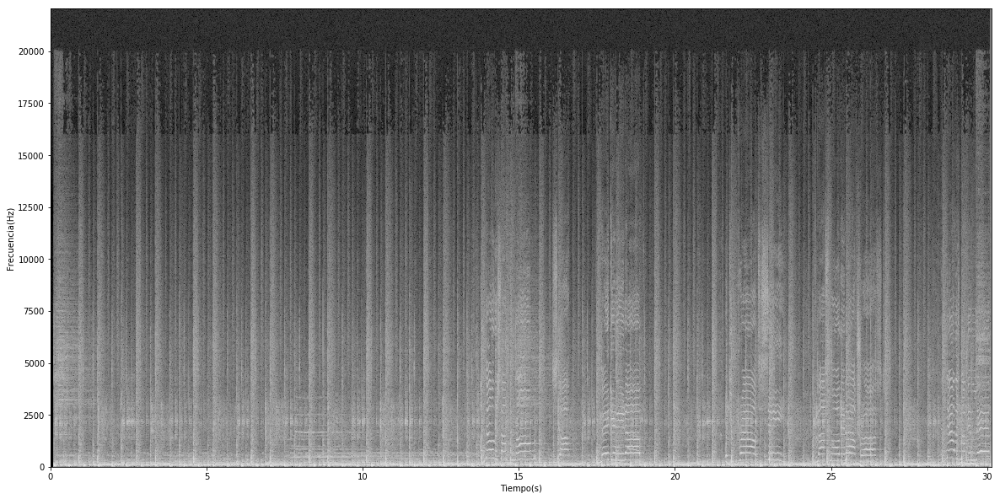

In [7]:
fig, specaxes = plt.subplots(nrows = 1, ncols=1,figsize=(20,10))
specaxes.pcolorfast(t,f,10*np.log10(magspec+eps),cmap='gray',vmin = -70, vmax = 0)
specaxes.set_xlabel('Tiempo(s)')
specaxes.set_ylabel('Frecuencia(Hz)')
plt.show()


Así es como se ve la magnitud de la STFT. También denominada espectrograma. A simple vista, es posible determinar qué partes del espectrograma son percusivas y cuáles armónicas. Una componente percusiva, como un golpe de redoblante, tendrá una corta duración y tenderá a ser de banda ancha. Esto en un espectrograma se verá como una línea vertical (abarca todas las frecuencias pero muy poco tiempo). Por el contrario, una componente armónica tendrá una mayor duración y ocupará frecuencias específicas relacionadas a su fundamental. Por esto, en el espectrograma se verá como una línea horizontal.

Si logramos identificar las líneas verticales y las horizontales en un espectrograma, seremos capaces de separar las componentes armónicas de las percusivas. Para lograr esto, se aplican filtros de mediana móvil. 

Si ordenamos todos los valores de una secuencia y tomamos el del medio, ese valor será la mediana. Esto es distinto de la media, la cual consiste de un promedio de los valores. La ventajas de la mediana por sobre la media son principalmente su robustez a outliers, ya que si tengo un número muy distinto a los demás, pesará en el resultado de la media, pero no en el de la mediana ya que en el ordenamiento quedará en un extremo. A su vez, la media no necesariamente es un valor perteneciente a la secuencia, en cambio la mediana sí (siempre que el tamaño de la secuencia sea impar y sea entonces posible tomar el valor del medio).

Entonces, cómo usamos todo esto de la mediana para detectar líneas?

El truco es que si calculo la mediana en pedacitos de cada columna, reemplazaré los valores de la columna por los que más aparecen. Si tengo componentes percusivas, todos los valores de la columna (frecuencias) serán elevados, y por ende la mediana también lo será y se conservará la línea vertical. Pero si las componentes son armónicas, los valores en donde la amplitud es alta serán pocos en cada columna, y por ende, la mediana será un número bajo. De esta manera, calculando la mediana en columnas es posible enfatizar las líneas verticales. De modo análogo, tomando la mediana en filas, se enfatizan las líneas horizontales.

In [8]:
def medianfilter(array,L,S):
    nrows = ((array.size-L)//S+1)
    n = array.strides[0]
    strided = np.lib.stride_tricks.as_strided(array, shape = (nrows,L), strides = (S*n,n))
    medianfiltered = np.median(strided,axis=1)
    return medianfiltered

La función que definí, medianfilter, permite calcular la mediana en cachitos de largo L pegando saltitos de S elementos en el vector array. Su implementación es algo retorcida, pero es para evitar el uso de bucles for los cuales en Python se ejecutan lento.

In [9]:
LH = 10
LP = 30
shmag = np.shape(magspec)
nframes = shmag[1]
nfreqs = shmag[0]
magspecpaddedperc = np.concatenate((magspec,np.zeros((LP-1,nframes))))
magspecpaddedharm = np.concatenate((magspec,np.zeros((nfreqs,LH-1))),axis = 1)
percussive = []
harmonic = []

for col in magspecpaddedperc.T:
    percussive.append(medianfilter(col,LP,1))
percussive = np.array(percussive)
percussive = percussive.T

for row in magspecpaddedharm:
    harmonic.append(medianfilter(row,LH,1))

harmonic = np.array(harmonic)


print(np.shape(percussive))
print(np.shape(harmonic))

(1025, 1299)
(1025, 1299)


LH y LP son los tamaños de los filtros de mediana movil para el énfasis de armónicos y el percusivo respectivamente. Primero, para mantener las dimensiones del espectrograma luego de filtrar, se agregan los ceros necesarios (zero padding). Luego se obtienen los espectrogramas filtrados.

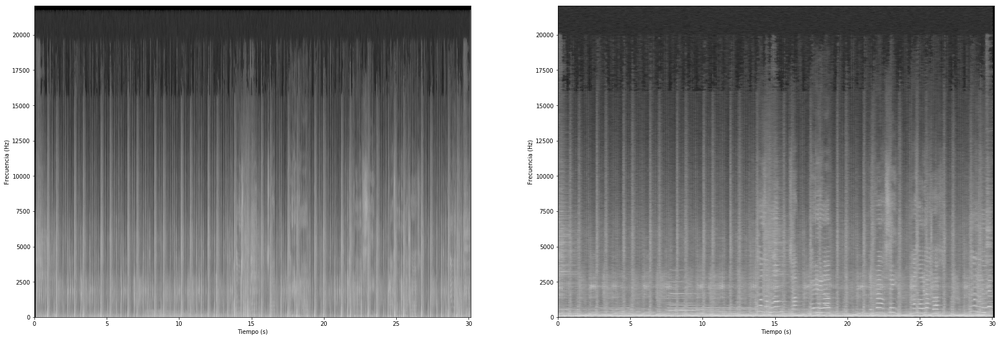

In [10]:
fig, specaxes = plt.subplots(nrows = 1, ncols=2,figsize=(30,10))
specaxes[0].pcolorfast(t,f,10*np.log10(np.array(percussive)+eps),cmap='gray',vmin = -70, vmax = 0)
specaxes[1].pcolorfast(t,f,10*np.log10(np.array(harmonic)+eps),cmap='gray',vmin = -70, vmax = 0)
specaxes[0].set_xlabel('Tiempo (s)')
specaxes[1].set_xlabel('Tiempo (s)')
specaxes[0].set_ylabel('Frecuencia (Hz)')
specaxes[1].set_ylabel('Frecuencia (Hz)')

plt.show()

A la izquierda se puede observar el espectrograma enfatizando las componentes percusivas, y en la derecha el que enfatiza las armónicas. Ahora, para cada punto del espectrograma habrá que ver qué predomina, si lo armónico o lo percusivo.

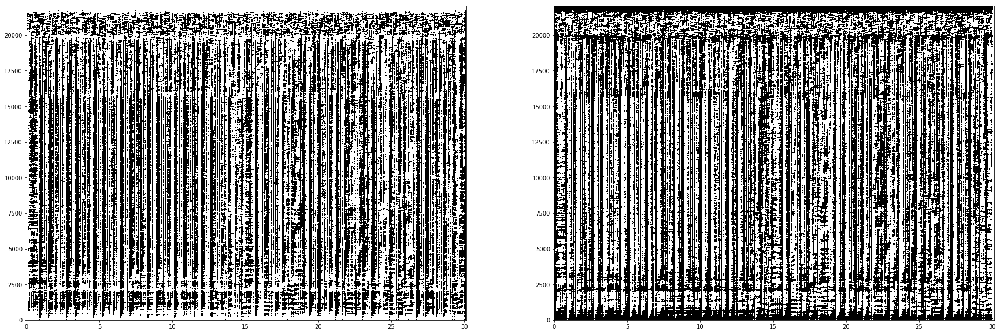

In [11]:
perbm = percussive>harmonic
harbm = harmonic>percussive

fig, specaxes = plt.subplots(nrows = 1, ncols=2,figsize=(30,10))
specaxes[0].pcolorfast(t,f,perbm,cmap='binary',vmin = 0, vmax = 1)
specaxes[1].pcolorfast(t,f,harbm,cmap='binary',vmin = 0, vmax = 1)
plt.show()

Para eso, se comparan los 2 espectrogramas obtenidos. De esta forma, se obtienen máscaras binarias para las componentes percusivas y armónicas. En la izquierda está la máscara binaria para separar componentes percusivas, la cual vale 1 cuando predominan las componentes percusivas y 0 cuando no. La de la derecha es la máscara binaria opuesta, la cual sirve para separar las componentes armónicas.

In [12]:
percspec = np.multiply(spec,perbm)
harmspec = np.multiply(spec,harbm)

Ahora, multiplicamos elemento a elemento las máscaras binarias con el espectrograma original. De esta forma estamos filtrando el espectrograma y quedandonos sólo con las componentes de interés. Esto es un filtrado variante en el tiempo.

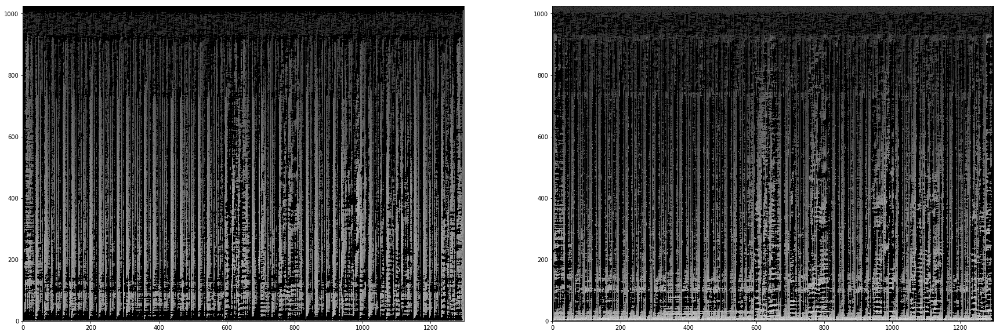

In [13]:
fig, specaxes = plt.subplots(nrows = 1, ncols=2,figsize=(30,10))
specaxes[0].pcolorfast(10*np.log10(np.abs(percspec+eps)),cmap='gray',vmin = -70, vmax = 0)
specaxes[1].pcolorfast(10*np.log10(np.abs(harmspec+eps)),cmap='gray',vmin = -70, vmax = 0)
plt.show()

Los espectrogramas filtrados se pueden ver arriba. A la izquierda están las componentes percusivas, y a la derecha la armónicas. Quizás parezca que el filtrado no fue muy efectivo, sin embargo vamos a escuchar los audios. Para eso hay que invertir los espectrogramas.

In [14]:
[t,xperc] = istft(percspec, fs = fs, window='hann',nperseg = 2048,noverlap = 1024)
[t,xharm] = istft(harmspec, fs = fs, window='hann',nperseg = 2048,noverlap = 1024)

Este es el audio original:

In [20]:
from IPython.display import Audio

Audio(xharm+xperc,rate = fs)

Estas son las componentes percusivas obtenidas mediante el filtrado:

In [21]:
Audio(xperc,rate = fs)


Estas son las componentes armónicas:

In [22]:
Audio(xharm,rate = fs)

Hasta la próxima!